In [8]:
#imports

import sys
print(sys.executable)

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.table import Table
import torch
from pathlib import Path
import rasterio
from utils import augmentations, geofiles




/scratch2/Arno_MT/MT_env/bin/python


In [9]:
examples_losses = torch.load("examples/test_examples_losses.pth")
print(examples_losses[-1])

examples_metrics = torch.load("examples/test_examples_metrics.pth")
print(examples_metrics[0])


('spacenet7', 'L15-1438E-1134N_5753_3655_13', 0.4389078617095947, 0.46499067544937134, 0.45280373096466064, 0.20329660177230835, 1.559998869895935)
('spacenet7', 'L15-0368E-1245N_1474_3210_13', 0.7251080274581909, 0.5139529705047607, 0.691922664642334, 0.9091246128082275, 0.9924978017807007, 0.8343958854675293, 0.8067560791969299, 0.6772172451019287, 0.7565097808837891, 0.6761032342910767, 0.5119640231132507, 0.6083760857582092, 0.5166338682174683, 0.16189046204090118, 0.43386751413345337)


In [14]:
def _get_sentinel1_data(site, aoi_id):
    file = Path(f'../GM12_GUM/{site}/sentinel1/sentinel1_{aoi_id}.tif')
    img, transform, crs = geofiles.read_tif(file)
    return np.nan_to_num(img).astype(np.float32), transform, crs

def _get_sentinel2_data(site, aoi_id):
    file = Path(f'../GM12_GUM/{site}/sentinel2/sentinel2_{aoi_id}.tif')
    img, transform, crs = geofiles.read_tif(file)
    return np.nan_to_num(img).astype(np.float32), transform, crs

def _get_label_data(site, aoi_id):
    label = "buildings"
    label_file = Path("../GM12_GUM/" + site + "/" + label + "/" + f'{label}_{aoi_id}.tif')
    img, transform, crs = geofiles.read_tif(label_file)
    img = img > 0
    return np.nan_to_num(img).astype(np.float32), transform, crs

def _get_pred_data(site, patch_id):
    file = Path('../GM12_GUM/' + site + f'/predictions_KTH/prediction_fusion_{patch_id}.tif')
    pred_fusion, transform, crs = geofiles.read_tif(file)
    file = Path('../GM12_GUM/' + site + f'/predictions_KTH/prediction_SAR_{patch_id}.tif')
    pred_SAR, _, _ = geofiles.read_tif(file)
    file = Path('../GM12_GUM/' + site + f'/predictions_KTH/prediction_optical_{patch_id}.tif')
    pred_optical, _, _ = geofiles.read_tif(file)
    return np.nan_to_num(pred_fusion).astype(np.float32), np.nan_to_num(pred_SAR).astype(np.float32), np.nan_to_num(pred_optical).astype(np.float32), transform, crs

def get_rgb(x):

    quantile = 99

    rgb = np.flip(x[:,:,:3],axis=2)

    maxi = np.percentile(rgb[:,:,0].flatten(),quantile)
    mini = np.percentile(rgb[:,:,0].flatten(),100-quantile)
    rgb[:,:,0] = np.where(rgb[:,:,0] > maxi, maxi, rgb[:,:,0])
    rgb[:,:,0] = np.where(rgb[:,:,0] < mini, mini, rgb[:,:,0])
    rgb[:,:,0] = (rgb[:,:,0]-mini)/(maxi-mini)

    maxi = np.percentile(rgb[:,:,1].flatten(),quantile)
    mini = np.percentile(rgb[:,:,1].flatten(),100-quantile)
    rgb[:,:,1] = np.where(rgb[:,:,1] > maxi, maxi, rgb[:,:,1])
    rgb[:,:,1] = np.where(rgb[:,:,1] < mini, mini, rgb[:,:,1])
    rgb[:,:,1] = (rgb[:,:,1]-mini)/(maxi-mini)

    maxi = np.percentile(rgb[:,:,2].flatten(),quantile)
    mini = np.percentile(rgb[:,:,2].flatten(),100-quantile)
    rgb[:,:,2] = np.where(rgb[:,:,2] > maxi, maxi, rgb[:,:,2])
    rgb[:,:,2] = np.where(rgb[:,:,2] < mini, mini, rgb[:,:,2])
    rgb[:,:,2] = (rgb[:,:,2]-mini)/(maxi-mini)

    return rgb



spacenet7 L15-1438E-1134N_5753_3655_13


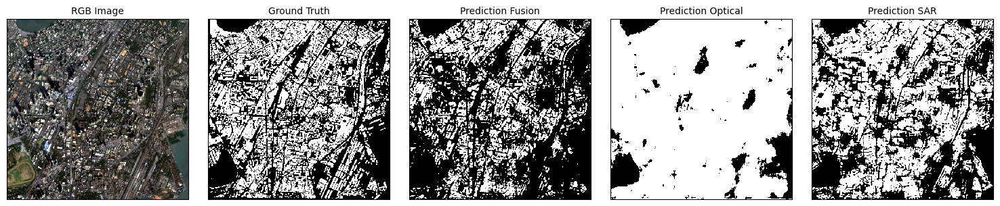

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-0368E-1245N_1474_3210_13


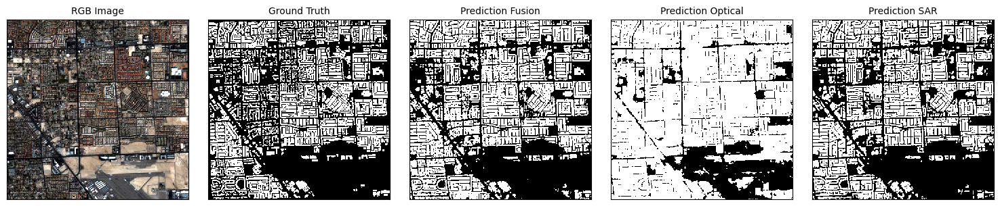

spacenet7 L15-0544E-1228N_2176_3279_13


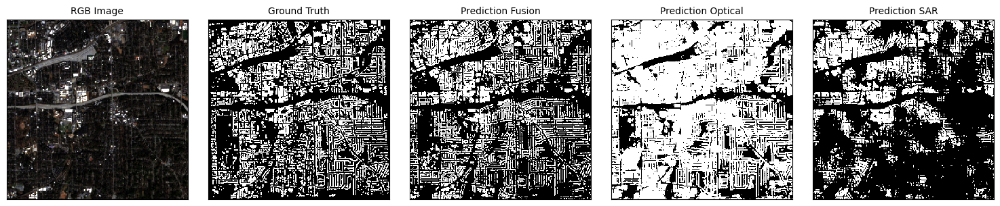

spacenet7 L15-1014E-1375N_4056_2688_13


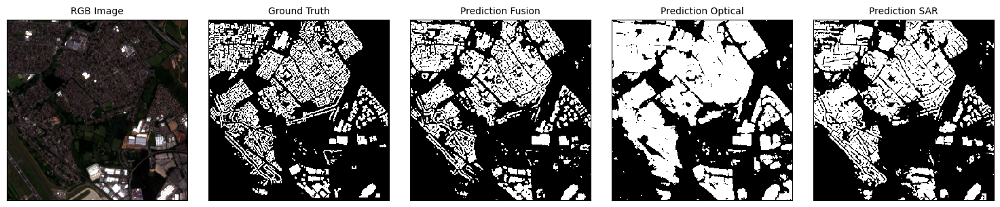

spacenet7 L15-1289E-1169N_5156_3514_13


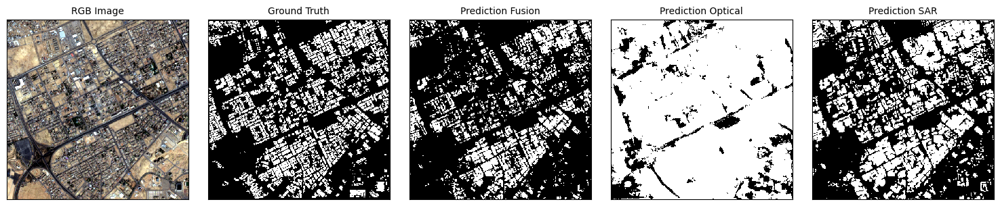

spacenet7 L15-0571E-1075N_2287_3888_13


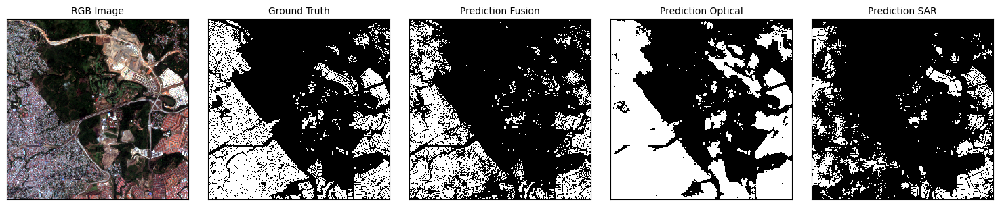

spacenet7 L15-0457E-1135N_1831_3648_13


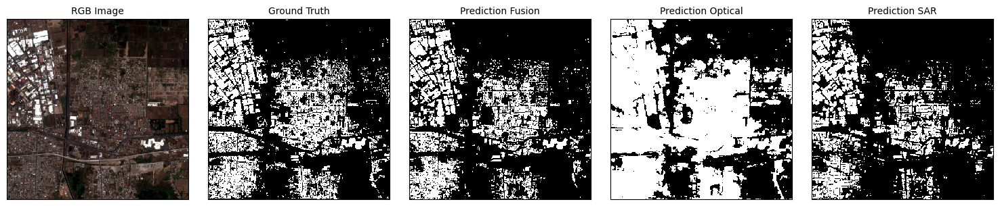

spacenet7 L15-1716E-1211N_6864_3345_13


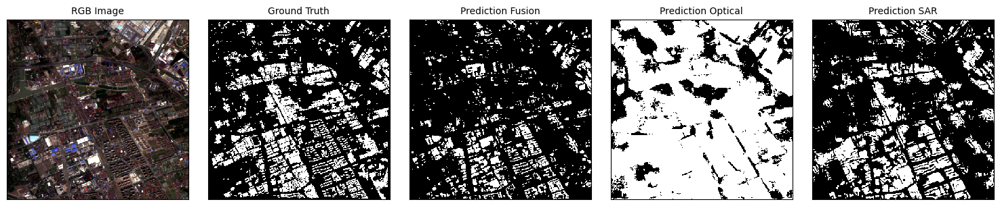

spacenet7 L15-1439E-1134N_5759_3655_13


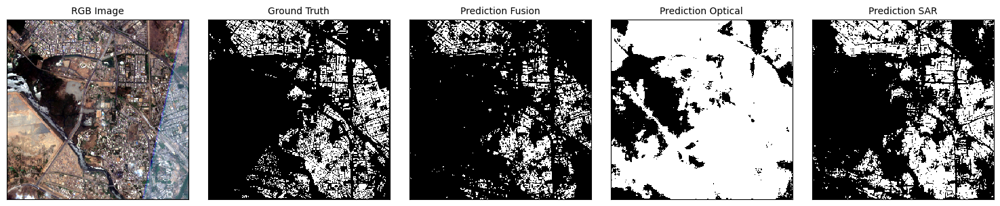

spacenet7 L15-1185E-0935N_4742_4450_13


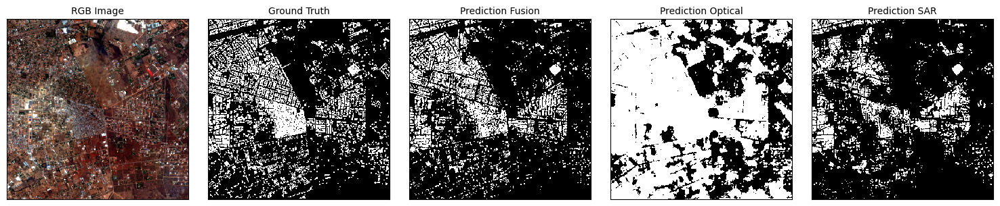

spacenet7 L15-1204E-1204N_4819_3372_13


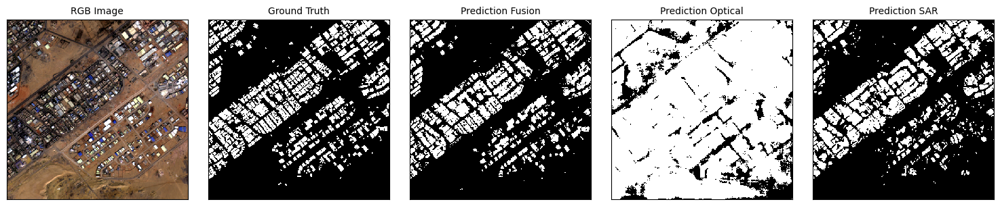

spacenet7 L15-1538E-1163N_6154_3539_13


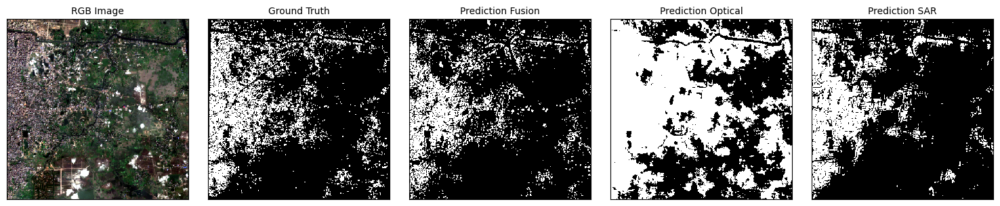

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-0924E-1108N_3699_3757_13


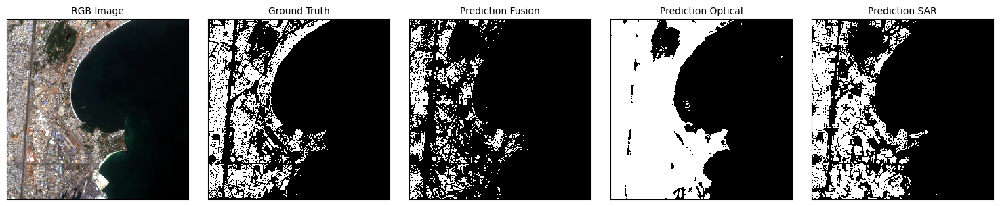

spacenet7 L15-1617E-1207N_6468_3360_13


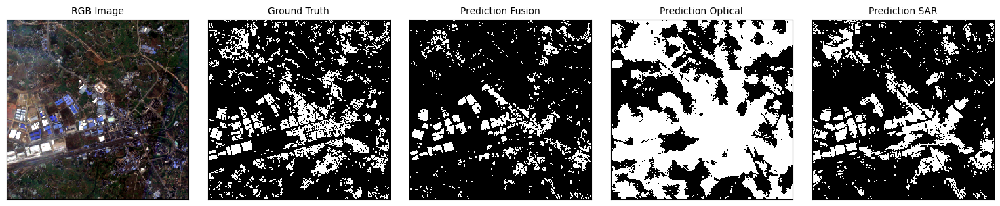

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1672E-1207N_6691_3363_13


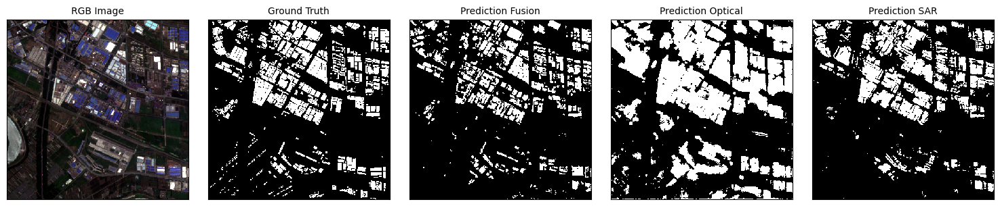

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1200E-0847N_4802_4803_13


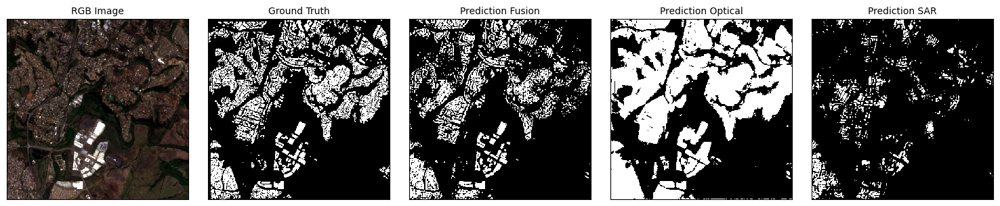

spacenet7 L15-0614E-0946N_2459_4406_13


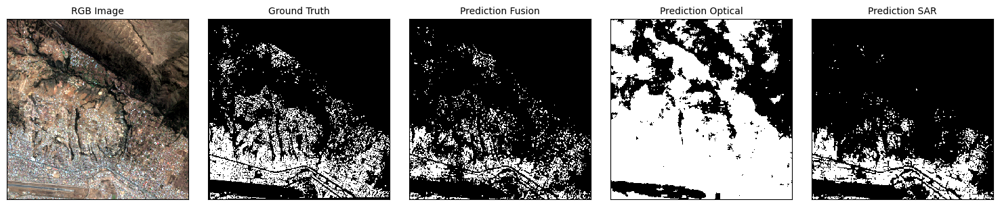

spacenet7 L15-1138E-1216N_4553_3325_13


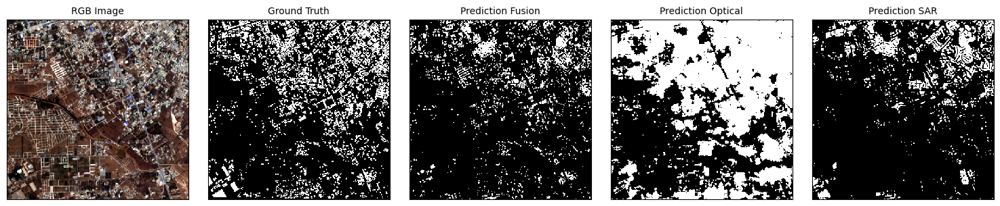

spacenet7 L15-1025E-1366N_4102_2726_13


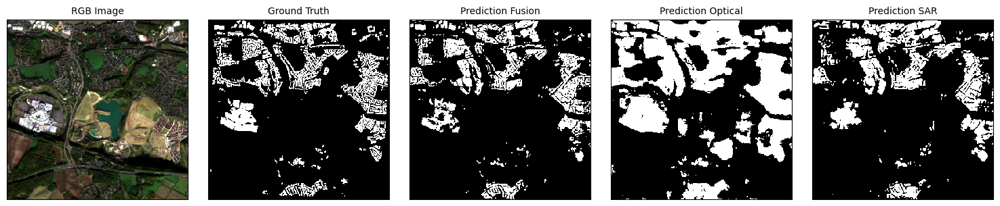

spacenet7 L15-0577E-1243N_2309_3217_13


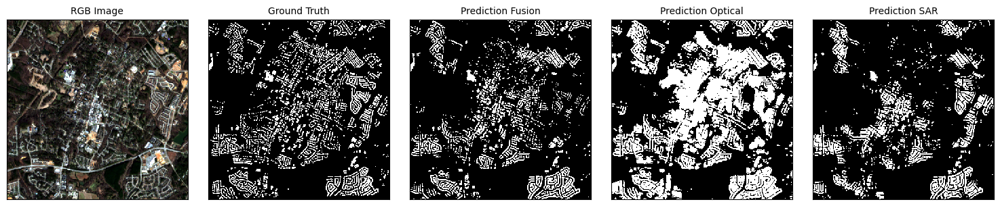

spacenet7 L15-0357E-1223N_1429_3296_13


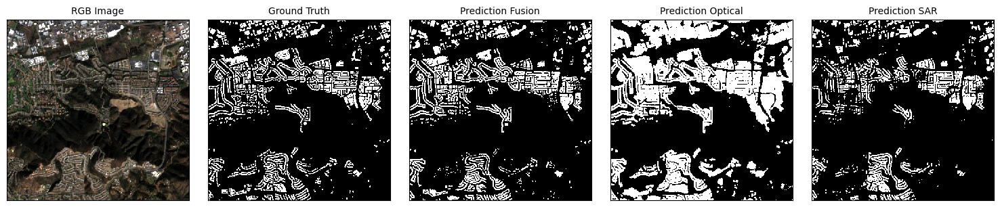

spacenet7 L15-0683E-1006N_2732_4164_13


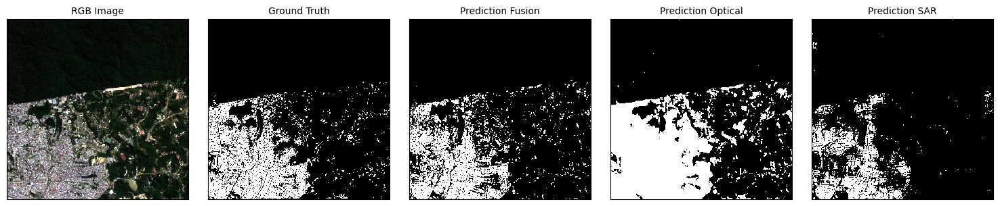

spacenet7 L15-0595E-1278N_2383_3079_13


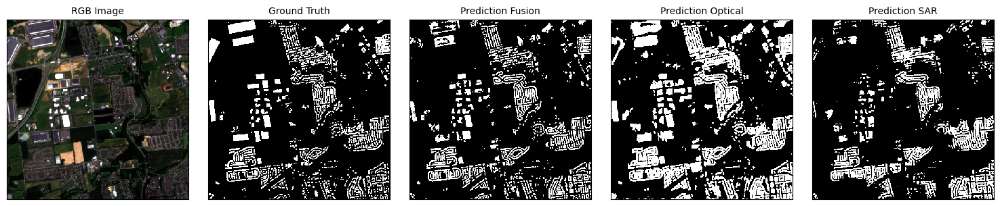

spacenet7 L15-0361E-1300N_1446_2989_13


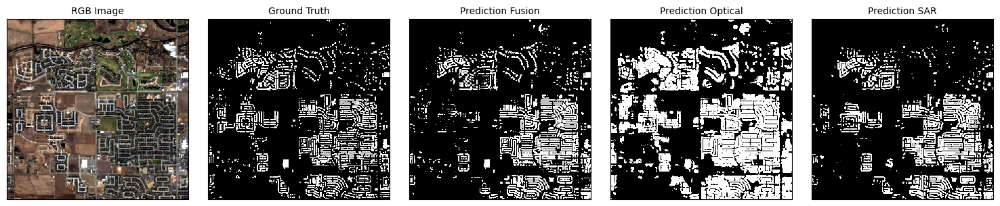

spacenet7 L15-1703E-1219N_6813_3313_13


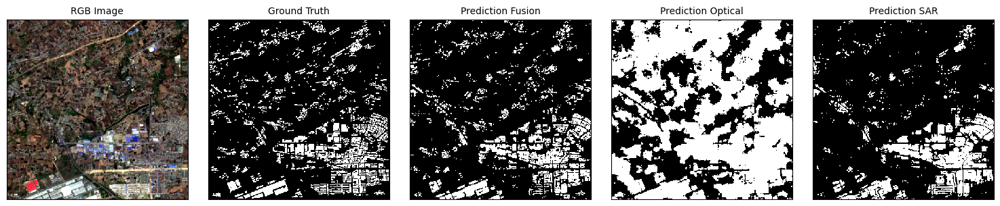

spacenet7 L15-0760E-0887N_3041_4643_13


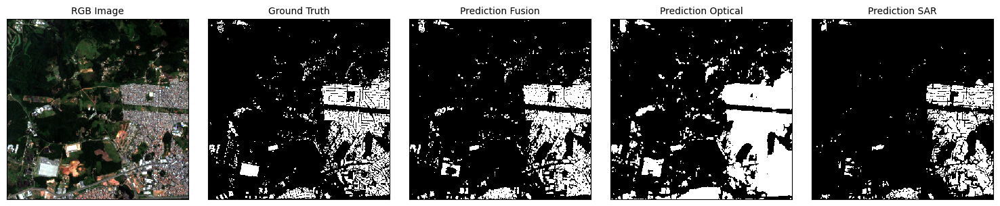

spacenet7 L15-1615E-1205N_6460_3370_13


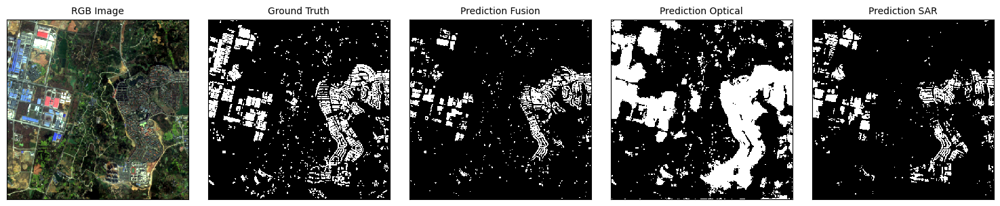

spacenet7 L15-1669E-1160N_6679_3549_13


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


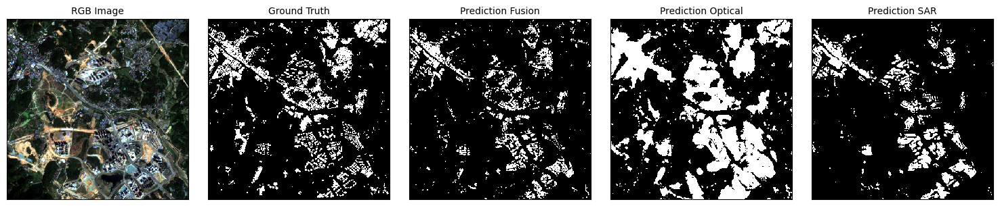

spacenet7 L15-0358E-1220N_1433_3310_13


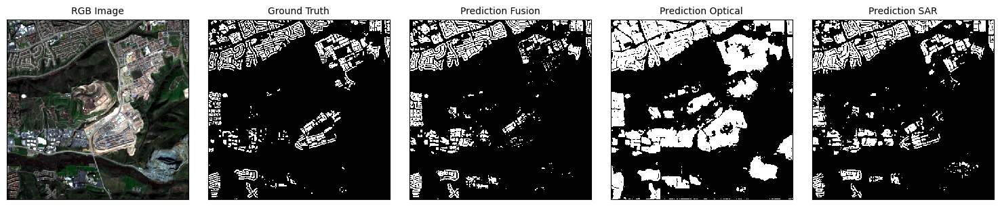

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1049E-1370N_4196_2710_13


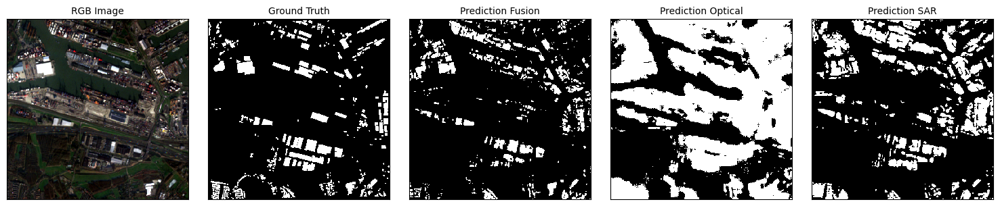

spacenet7 L15-1172E-1306N_4688_2967_13


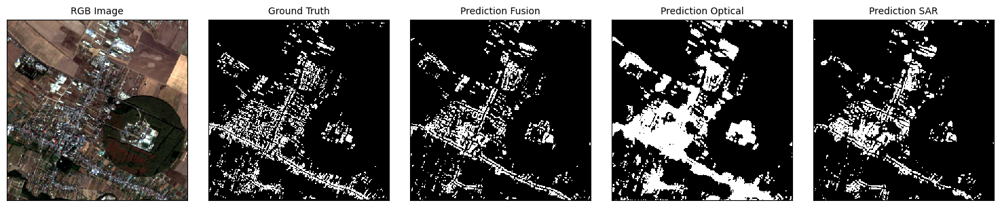

spacenet7 L15-1615E-1206N_6460_3366_13


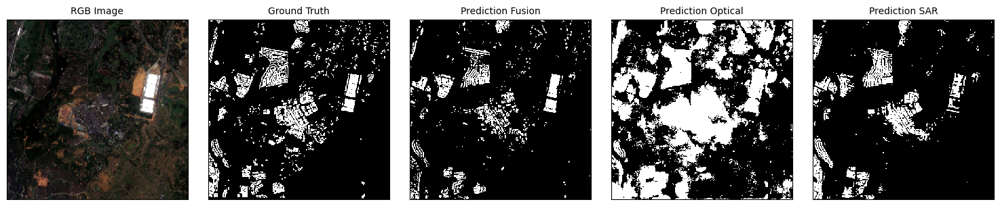

spacenet7 L15-1669E-1160N_6678_3548_13


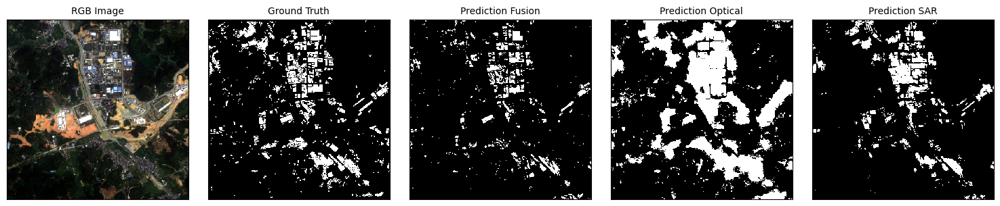

spacenet7 L15-0586E-1127N_2345_3680_13


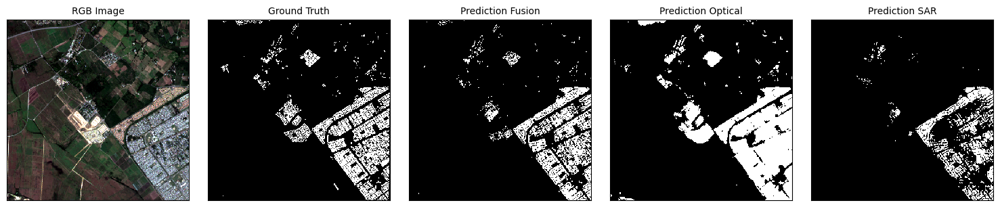

spacenet7 L15-1691E-1211N_6764_3347_13


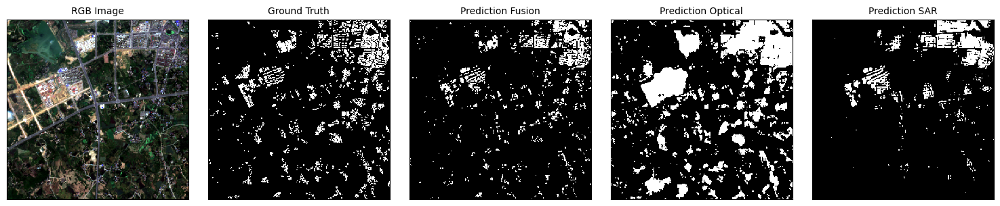

spacenet7 L15-1209E-1113N_4838_3737_13


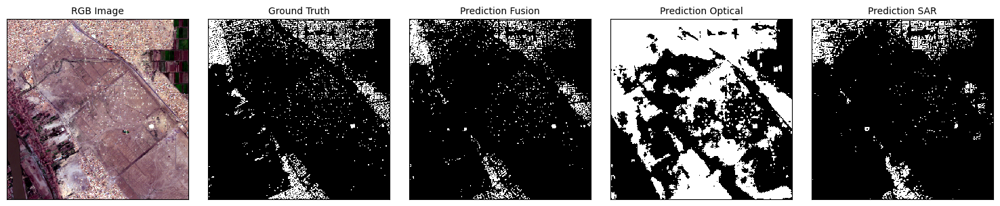

spacenet7 L15-1690E-1211N_6763_3346_13


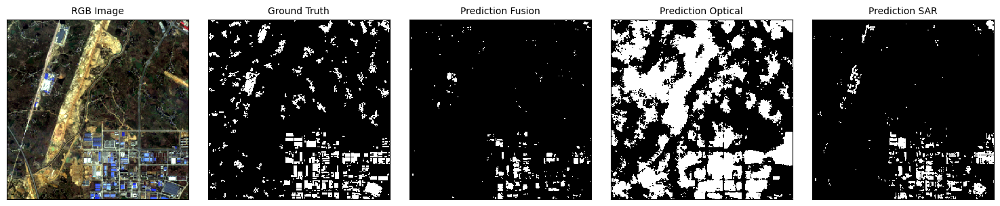

spacenet7 L15-1210E-1025N_4840_4088_13


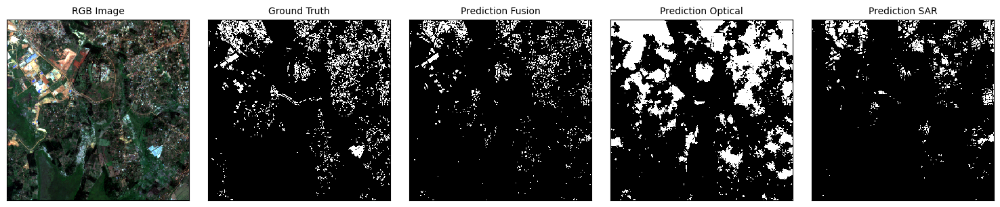

spacenet7 L15-1709E-1112N_6838_3742_13


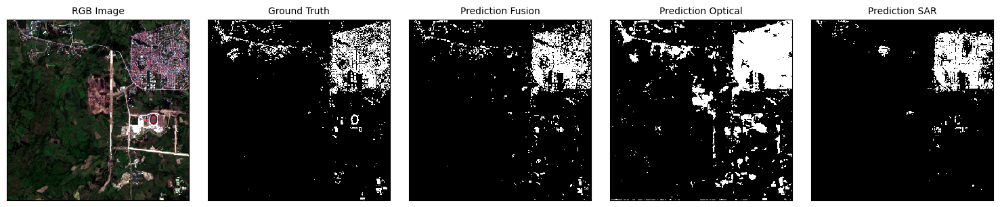

spacenet7 L15-0387E-1276N_1549_3087_13


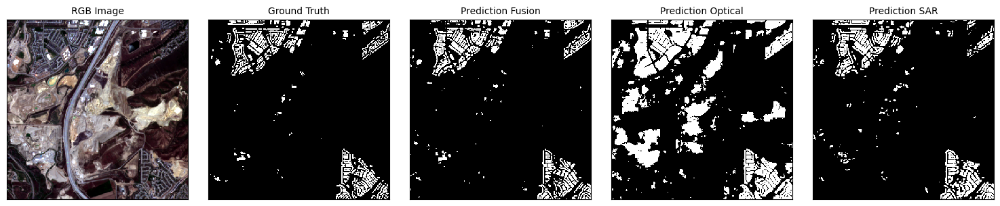

spacenet7 L15-1296E-1198N_5184_3399_13


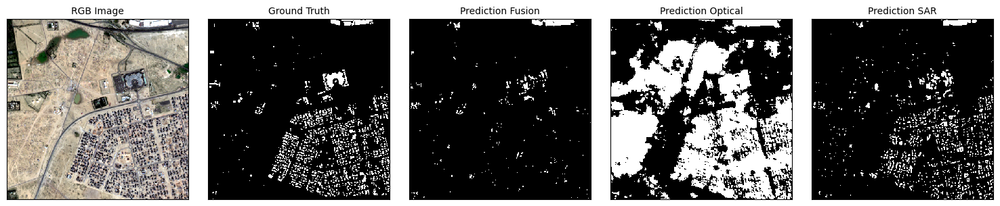

spacenet7 L15-0977E-1187N_3911_3441_13


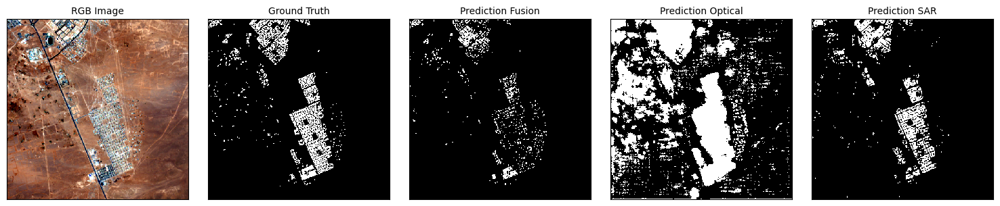

spacenet7 L15-0632E-0892N_2528_4620_13


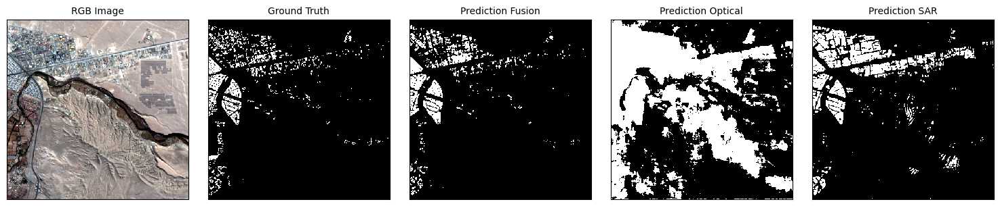

spacenet7 L15-0506E-1204N_2027_3374_13


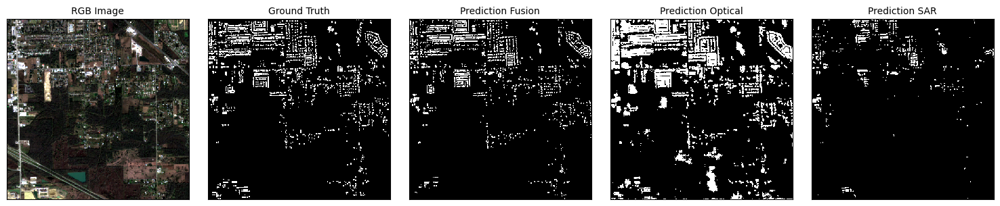

spacenet7 L15-1204E-1202N_4816_3380_13


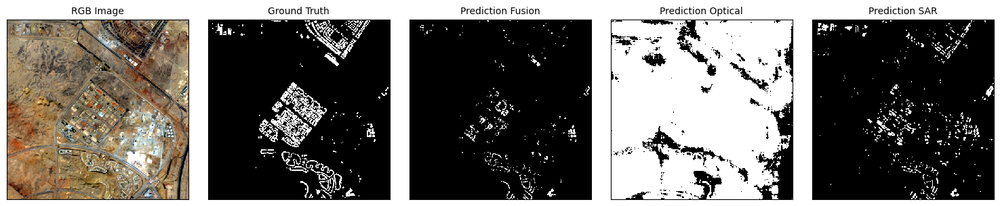

spacenet7 L15-1298E-1322N_5193_2903_13


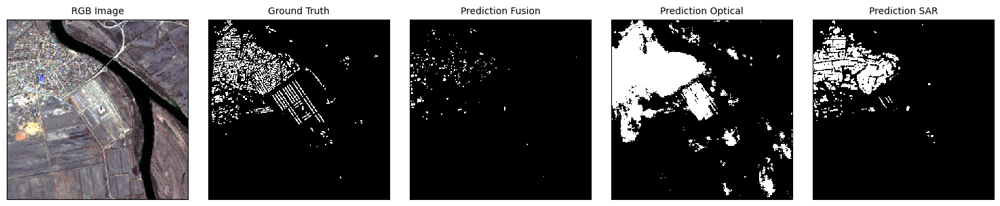

spacenet7 L15-1015E-1062N_4061_3941_13


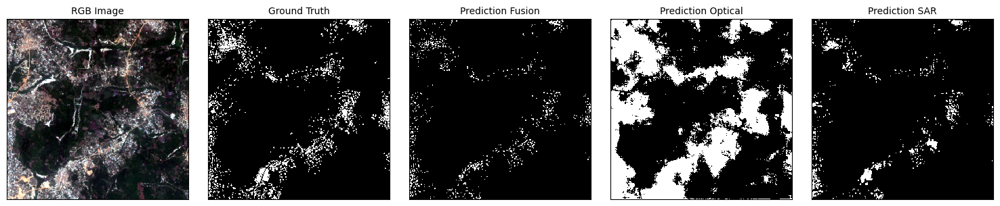

spacenet7 L15-0331E-1257N_1327_3160_13


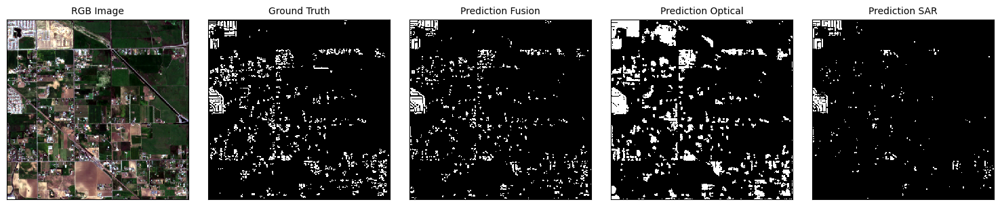

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1389E-1284N_5557_3054_13


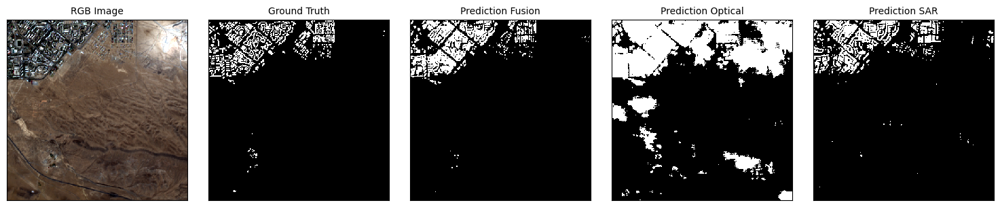

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1276E-1107N_5105_3761_13


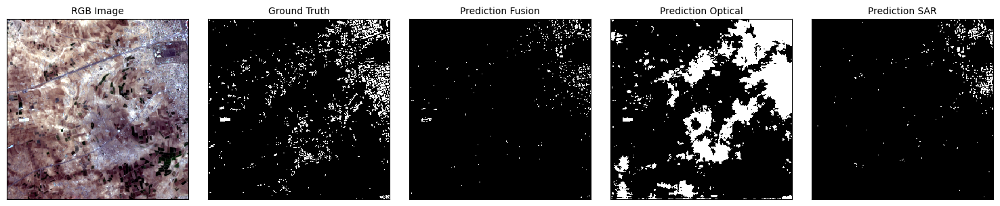

spacenet7 L15-1203E-1203N_4815_3378_13


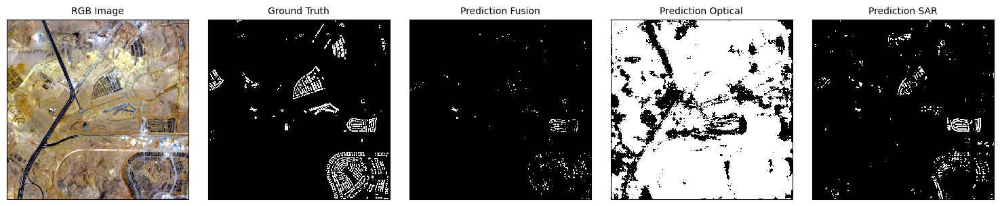

spacenet7 L15-1479E-1101N_5916_3785_13


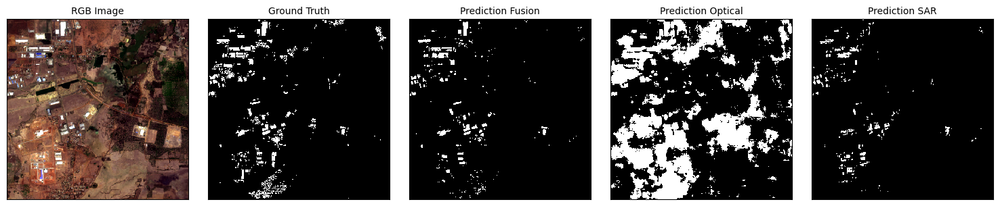

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-0487E-1246N_1950_3207_13


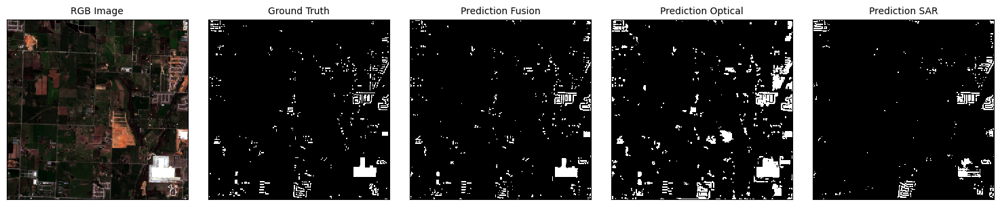

spacenet7 L15-1848E-0793N_7394_5018_13


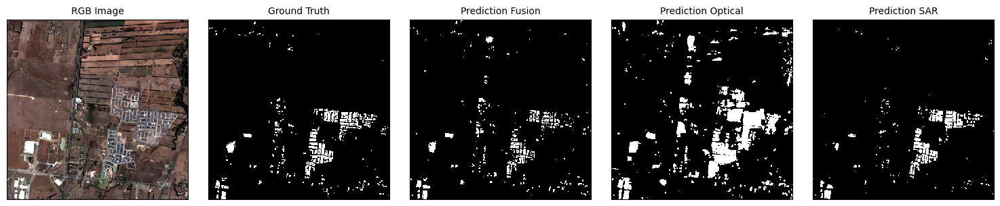

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


spacenet7 L15-1669E-1153N_6678_3579_13


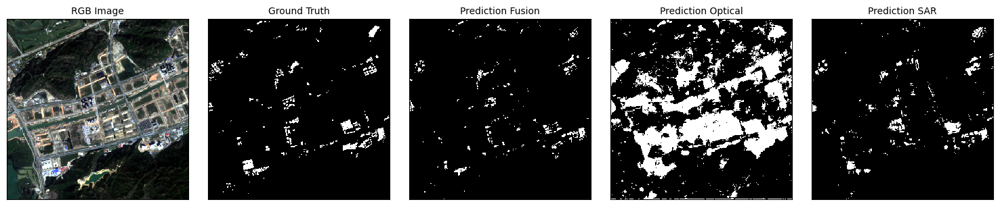

spacenet7 L15-1335E-1166N_5342_3524_13


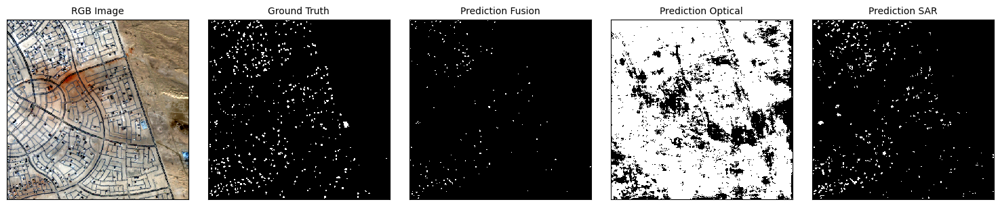

spacenet7 L15-1481E-1119N_5927_3715_13


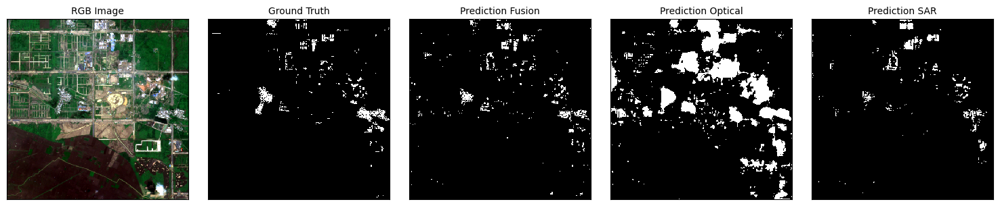

spacenet7 L15-1748E-1247N_6993_3202_13


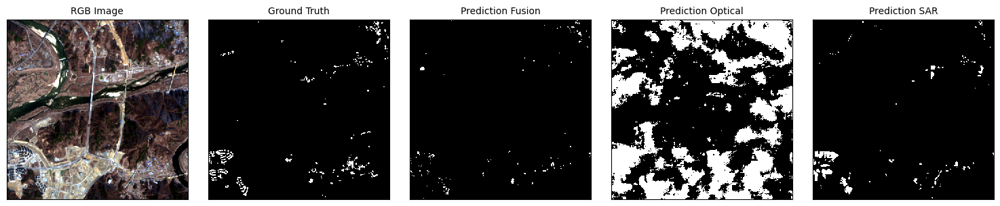

spacenet7 L15-0566E-1185N_2265_3451_13


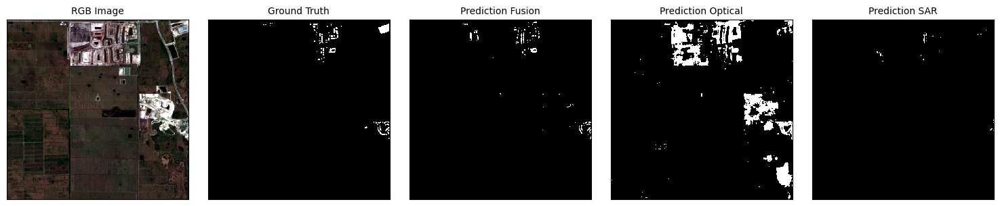

spacenet7 L15-0434E-1218N_1736_3318_13


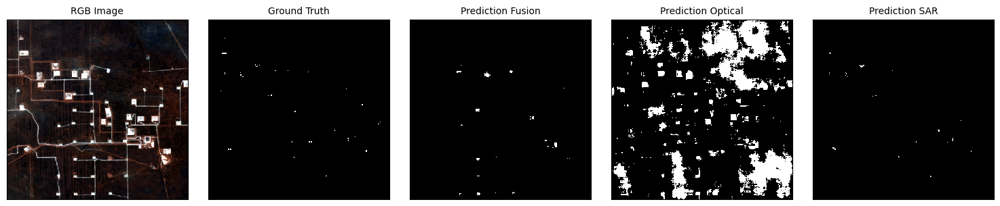

In [18]:

metric = "total_loss"
bestorworst = "best"
num_examples = 60
offset = 0

if metric in ["fusion_loss", "optical_loss","sar_loss","consistency_loss", "total_loss"]:
    ind = ["fusion_loss", "optical_loss","sar_loss","consistency_loss", "total_loss"].index(metric) + 2
    examples_losses.sort(key=lambda x: x[ind], reverse=False)
    if bestorworst=="best":
        examples = examples_losses[offset:num_examples+offset]
    else:
        examples = examples_losses[-num_examples-offset:-offset]

if metric in ["prec_fusion", "prec_OPT", "prec_SAR", "rec_fusion", "rec_OPT", "rec_SAR",
                "f1_fusion","f1_OPT","f1_SAR","IoU_fusion","IoU_OPT","IoU_SAR","ssim_fusion","ssim_OPT","ssim_SAR"]:
    ind = ["prec_fusion", "prec_OPT", "prec_SAR", "rec_fusion", "rec_OPT", "rec_SAR",
           "f1_fusion","f1_OPT","f1_SAR","IoU_fusion","IoU_OPT","IoU_SAR","ssim_fusion","ssim_OPT","ssim_SAR"].index(metric) + 2
    examples_metrics.sort(key=lambda x: x[ind], reverse=True)
    if bestorworst=="best":
        examples = examples_metrics[offset:num_examples+offset]
    else:
        examples = examples_metrics[-num_examples-offset:-offset]


image_names = ['RGB Image', 'Ground Truth', 'Prediction Fusion', 'Prediction Optical', 'Prediction SAR']
metrics = ['Precision: ', 'Recall: ', 'F1-score: ', 'IoU: ', 'SSIM: ']

for example in examples:

    print(example[0], example[1])
    sen1,_,_ = _get_sentinel1_data(example[0], example[1])
    sen2,_,_ = _get_sentinel2_data(example[0], example[1])
    label,_,_ = _get_label_data(example[0], example[1])
    pred_fusion, pred_sar, pred_optical,_,_ = _get_pred_data(example[0], example[1])

    images = [get_rgb(sen2), label, pred_fusion>0.5, pred_optical>0.5, pred_sar>0.5]
    fig, axes = plt.subplots(1, 5, figsize=(15, 3))

    # Iterate over the images and plot them in each subplot
    for i, image in enumerate(images):
        axes[i].imshow(image, interpolation="nearest", cmap="Greys_r")
        #axes[i].axis('off')
        # Remove the ticks
        axes[i].set_xticks([])
        axes[i].set_yticks([])
        
        # Add the image names and titles
        axes[i].set_title(image_names[i], fontsize=10)
        
        if metric in ["prec_fusion", "prec_OPT", "prec_SAR", "rec_fusion", "rec_OPT", "rec_SAR",
                "f1_fusion","f1_OPT","f1_SAR","IoU_fusion","IoU_OPT","IoU_SAR","ssim_fusion","ssim_OPT","ssim_SAR"]:
            if i >= 2:
                k=i-2
                # Create a table with the metrics
                table_data = [
                    [metrics[0], "{:.2f}".format(example[2+k])],
                    [metrics[1], "{:.2f}".format(example[5+k])],
                    [metrics[2], "{:.2f}".format(example[8+k])],
                    [metrics[3], "{:.2f}".format(example[11+k])],
                    [metrics[4], "{:.2f}".format(example[14+k])],
                ]
                table = axes[i].table(cellText=table_data, cellLoc='center', loc='bottom', bbox=[0, -0.6, 1, 0.5])

                # Style the table
                table.auto_set_font_size(True)
                #table.set_fontsize(8)
                table.scale(1, 1.5)

                # Add the table to the plot
                axes[i].add_table(table)


    # Adjust the spacing between subplots
    plt.tight_layout()

    # Save the plot for a report
    #plt.savefig('report_plot.png', dpi=300)

    # Display the plot
    plt.show()


prec_fusion


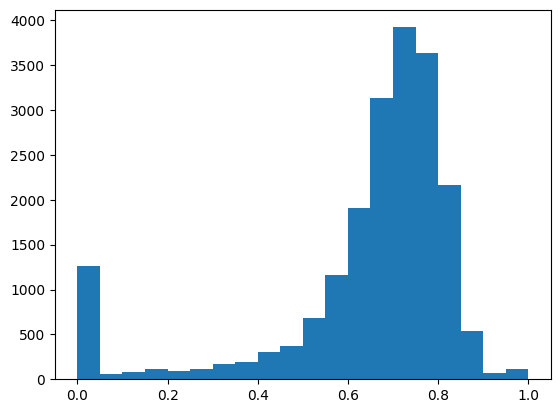

prec_OPT


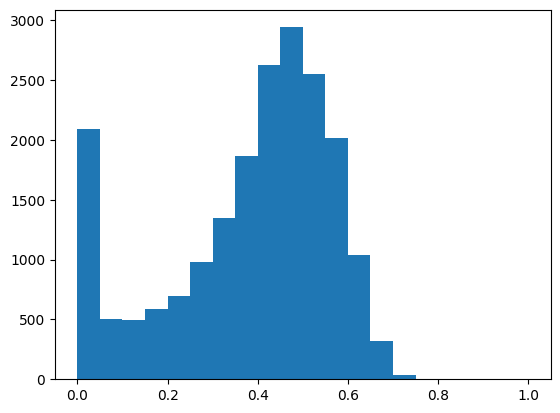

prec_SAR


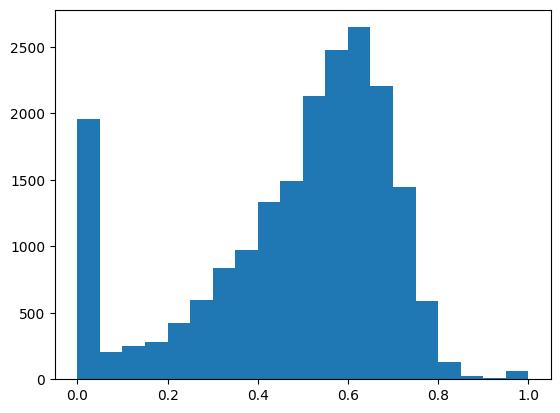

rec_fusion


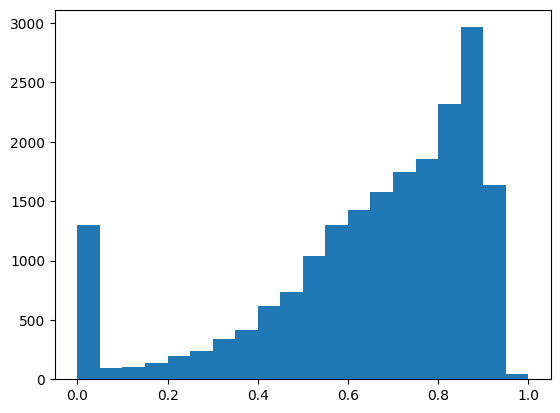

rec_OPT


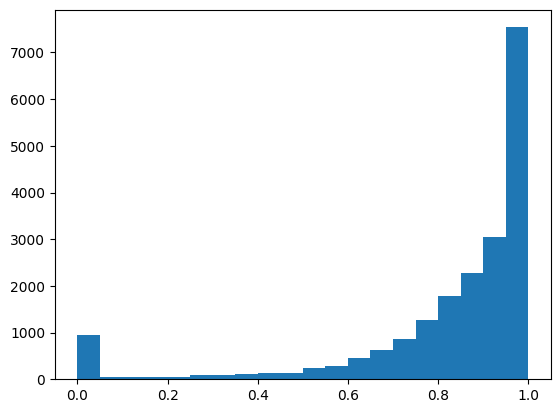

rec_SAR


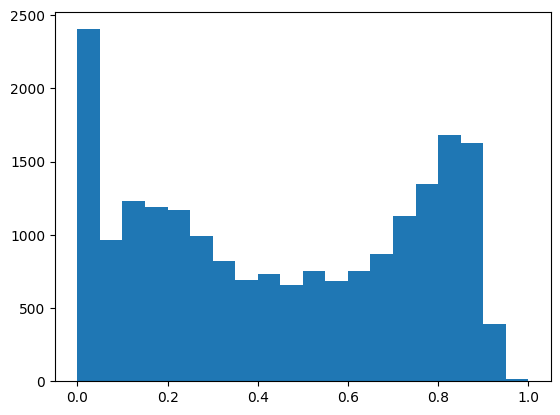

f1_fusion


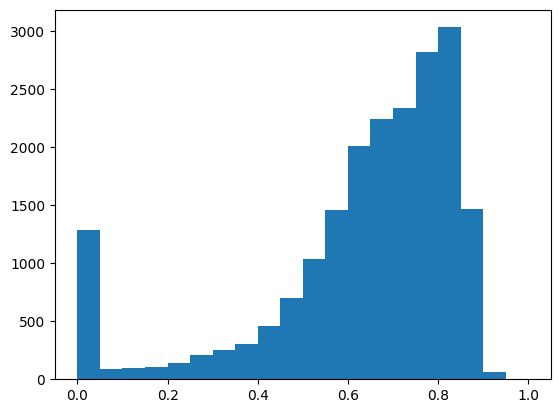

f1_OPT


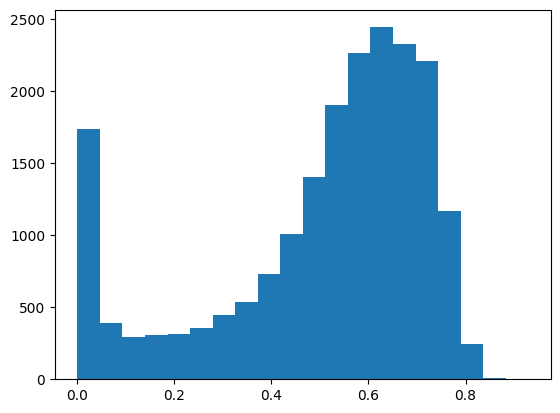

f1_SAR


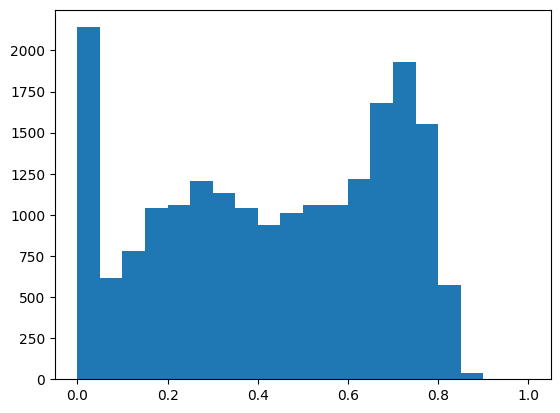

IoU_fusion


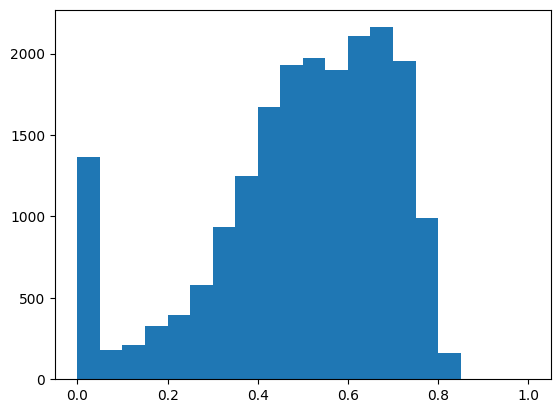

IoU_OPT


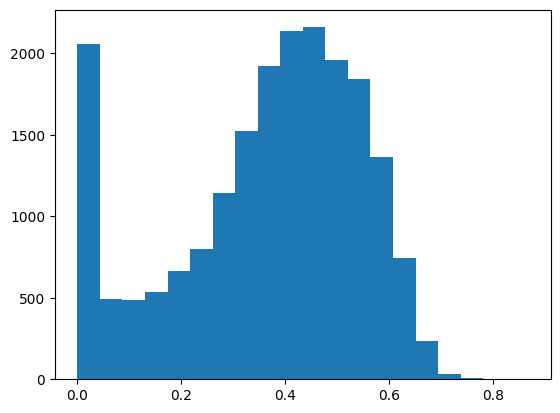

IoU_SAR


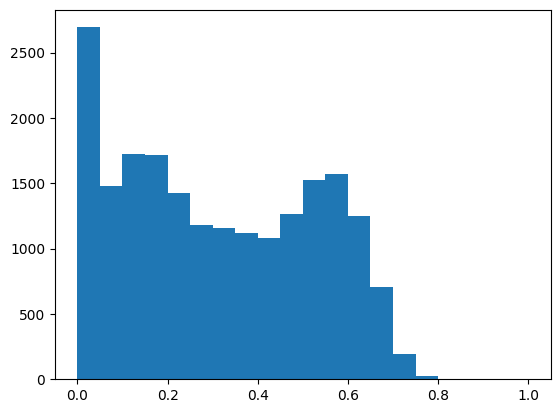

ssim_fusion


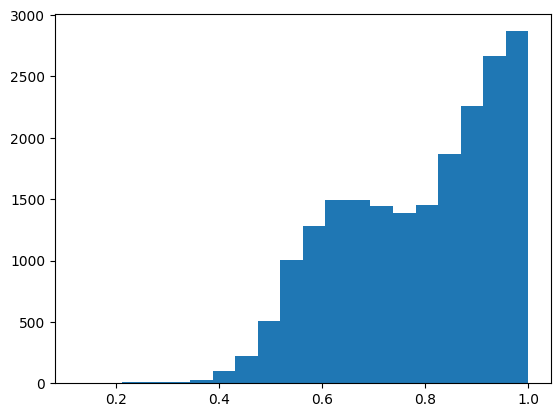

ssim_OPT


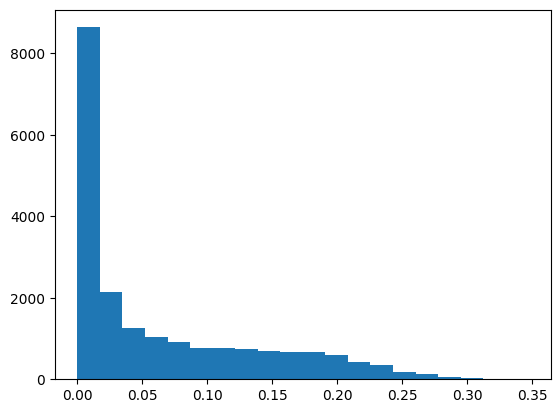

ssim_SAR


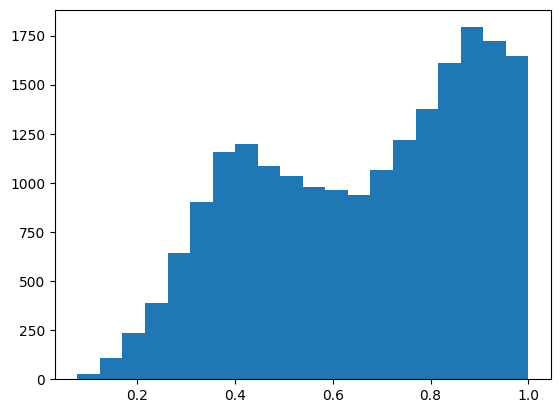

In [ ]:
examples_metrics = np.asarray(examples_metrics,  dtype=object)

metrics = ["site", "patch_id","prec_fusion", "prec_OPT", "prec_SAR", "rec_fusion", "rec_OPT", "rec_SAR",
           "f1_fusion","f1_OPT","f1_SAR","IoU_fusion","IoU_OPT","IoU_SAR","ssim_fusion","ssim_OPT","ssim_SAR"]

for i in range(2,examples_metrics.shape[1]):
    print(metrics[i])
    hist, bins = np.histogram(examples_metrics[:,i], bins=20)

    plt.bar(bins[:-1], hist, width=np.diff(bins), align='edge')
    plt.show()

fusion_loss


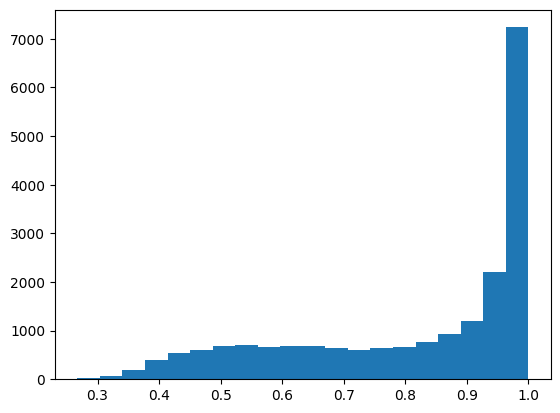

optical_loss


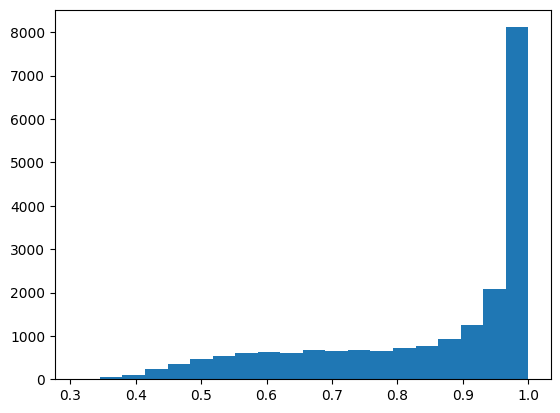

sar_loss


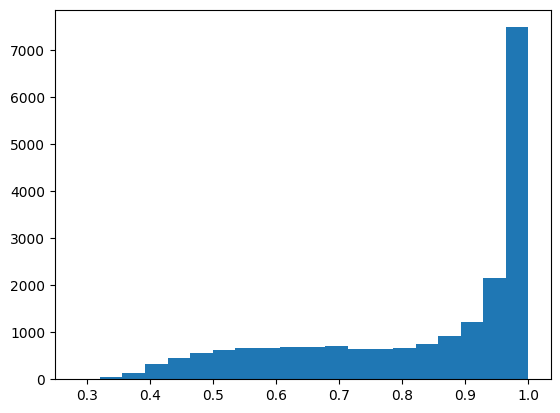

consistency_loss


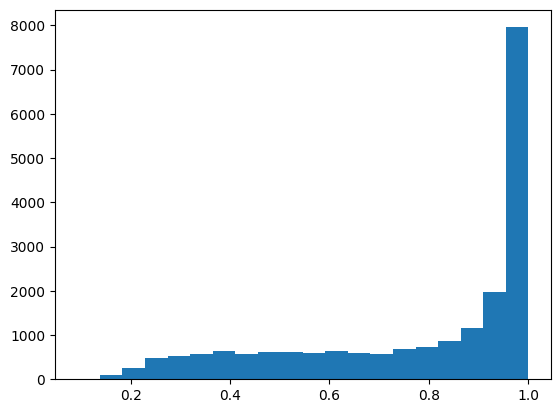

total_loss


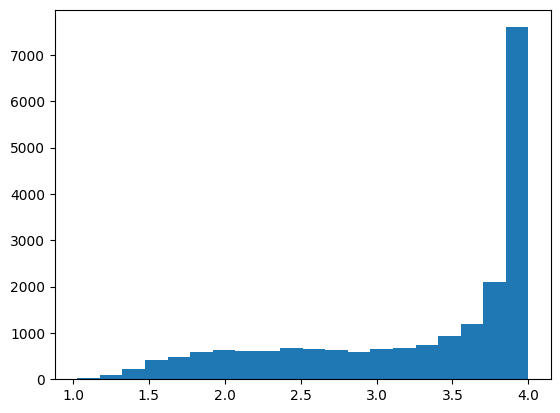

In [ ]:
examples_losses = np.asarray(examples_losses,  dtype=object)

metrics = ["site", "patch_id", "fusion_loss", "optical_loss","sar_loss","consistency_loss", "total_loss"]

for i in range(2,examples_losses.shape[1]):
    print(metrics[i])
    hist, bins = np.histogram(examples_losses[:,i], bins=20)

    plt.bar(bins[:-1], hist, width=np.diff(bins), align='edge')
    plt.show()